# Advanced lane detection

The objective of this project is to use techniques of computer vision to detect lane lines. We are going to use image calibration, perspective transform and filters to calculate the position of lane lines and draw them in the resulting video.


In [53]:
%matplotlib inline

import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import matplotlib.image as mpimage
import tensorflow as tf
import numpy as np
from sklearn.metrics import confusion_matrix
from sklearn.utils import shuffle
import time
from datetime import timedelta
import math
import pickle
import PIL.Image
import IPython.display
import matplotlib.gridspec as gridspec
import os
import cv2
import glob
from skimage.feature import hog
from skimage import data, color, exposure
from IPython.display import display
from ipywidgets import interact, interactive, fixed, interact_manual, FloatSlider, IntSlider
from sklearn.model_selection import GridSearchCV
import ipywidgets as widgets
from sklearn.cross_validation import train_test_split
from sklearn.preprocessing import StandardScaler


# Imports to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


The config object stores diferents parameters for the image pipeline.

In [2]:
class Config(dict):
    def __init__(self, *args, **kwargs):
        super(Config, self).__init__(*args, **kwargs)
        self.__dict__ = self
        
config = Config()

## Camera calibration

Using a set of chessboard images and cv2 functions we calculate the distortion matrix.

### Inspecting calibration images

First we inspect the calibration images. They are a set of chessboard images pictures from diferent distances and positions.

In [3]:
def load_images(pattern):
    '''
    load a set of images
    '''
    return [cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB) for file in glob.glob(pattern)]

def show_images(images, figsize=(20,10), nrows=5, ncols=5, cmap=None):
    '''
    show a set of images in a grid
    '''
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
    for image, ax in zip(images,axes.flat):
        ax.imshow(image, cmap=cmap)

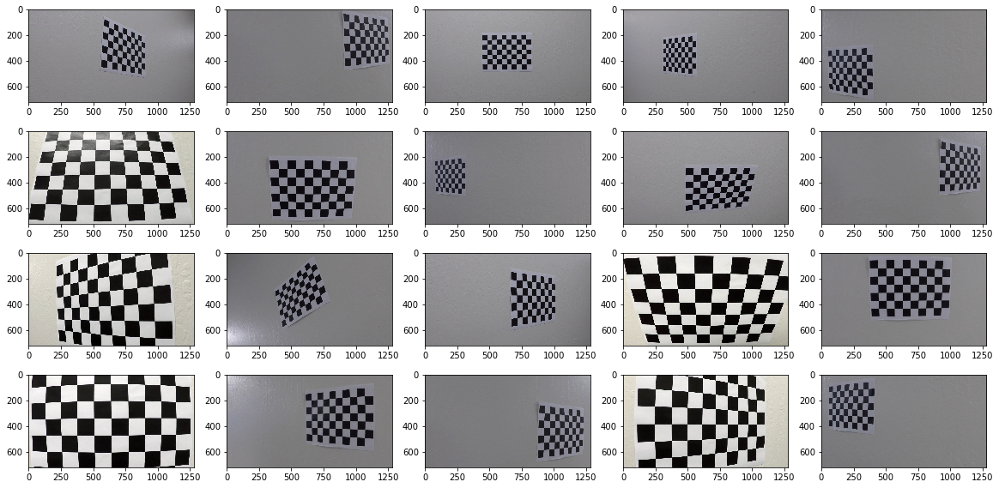

In [4]:
#set of calibration images
calibration_images = load_images("./camera_cal/*jpg")

#shows the set of calibration images
show_images(calibration_images, figsize=(20,10), nrows=4)

### Measuring camera distortion

Using cv2.findChessboardCorners we find the corners position in the images.

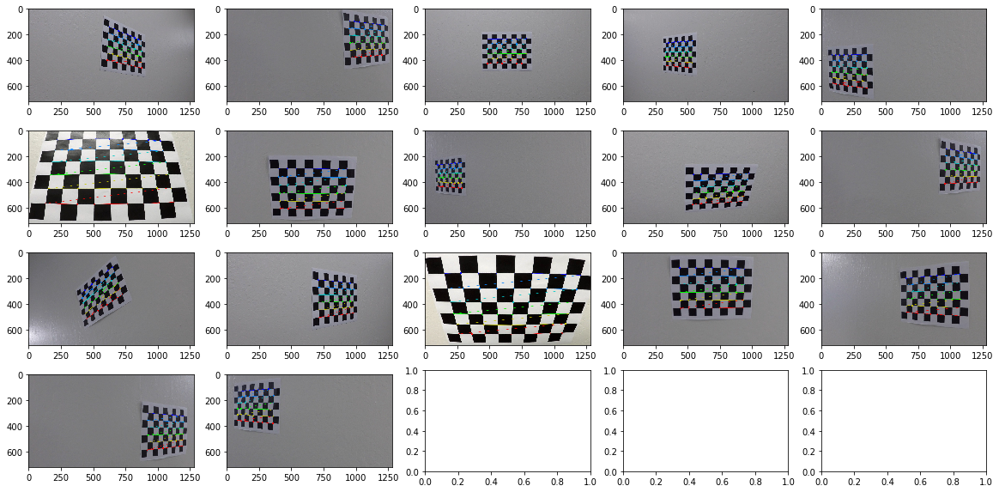

In [5]:
def calibrate_images(images, nx=9,ny=6):
    '''
    calibrate a set of checkboard images. 
    nx is the number of corners in x direction.
    ny is the number of corners in y direction.
    '''
    # termination criteria
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1, 2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane.
    rs_images = [] # result images

    for img in images:
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        # Find the chess board corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

        # If found, add object points, image points (after refining them)
        if ret == True:
            objpoints.append(objp)

            corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
            imgpoints.append(corners2)

            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (nx,ny), corners2,ret)
            rs_images.append(img)
    return objpoints, imgpoints, rs_images

objpoints, imgpoints, calibrated_images = calibrate_images(calibration_images)

#we show the checkboard images already calibrated.
show_images(calibrated_images, figsize=(20,10), nrows=4)

Using the corners positions and cv2.calibrateCamera we obtain the undistortion matrix.

In [6]:
#parameters of camera calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, calibration_images[0].shape[1::-1],None,None)

config.mtx = mtx
config.dist = dist

In [7]:
def undistord_image(image):
    '''
    using the previous parameters of camera calibration returns an undistorted version of the image.
    '''
    return cv2.undistort(image, config.mtx, config.dist, None, config.mtx)



### Inspecting test images

This are the set of test images.

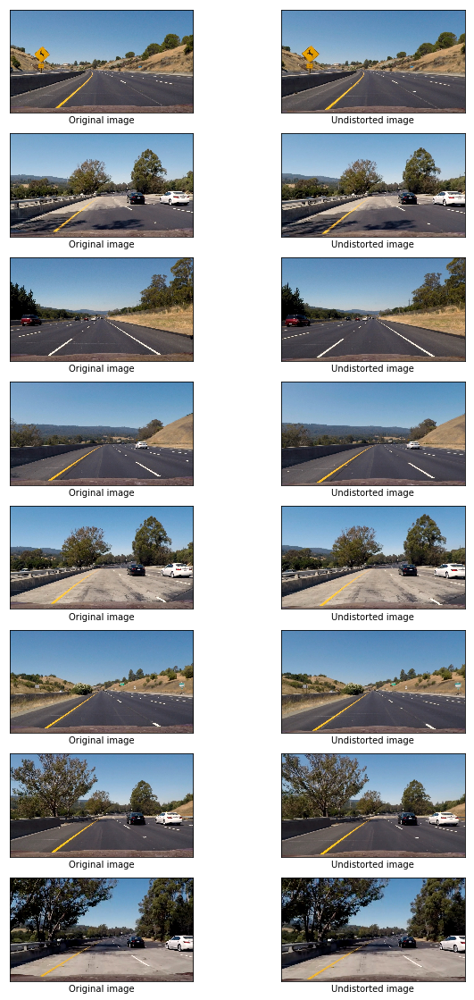

In [8]:
#test images
test_images = load_images("./test_images/*jpg")



def show_undistorted_images(original_images):
    undistorted_images = [undistord_image(image) for image in original_images]
    fig, axes = plt.subplots(len(original_images), 2, figsize=(10, 20))
    #fig.subplots_adjust(hspace=4, wspace=6)
    images = list(zip(original_images, undistorted_images))
    j=0
    for i, ax in enumerate(axes.flat):
        # Plot image.
        if i%2==0:
            ax.imshow(original_images[j])
            ax.set_xlabel('Original image')
        else:
            ax.imshow(undistorted_images[j])
            ax.set_xlabel('Undistorted image')
            j +=1
        ax.set_xticks([], [])
        ax.set_yticks([], [])
    
    # Ensure the plot is shown correctly with multiple plots
    # in a single Notebook cell.
    plt.show()
    
#show test images and undistorted version
show_undistorted_images(test_images)

## Perspective transform

We use perspective transform to change the view from the camera in front of the car to a "bird-eye" one.

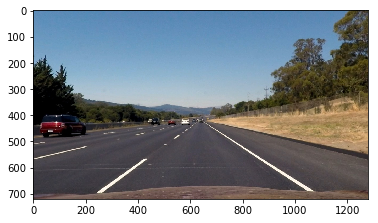

In [9]:
undistorted_test_images = [undistord_image(image) for image in test_images]
image = undistorted_test_images[2]

#show an undistorted image from the test images set.
imshow(image);

In [10]:
import imageio 

def load_images_from_video(filename, nframes=15):
    vid = imageio.get_reader(filename,  'ffmpeg')
    rs=[]
    for i, im in enumerate(vid):
        if i%nframes==0:
            rs.append(im)
    return rs


video_images = load_images_from_video('project_video.mp4')
video_images = [undistord_image(image) for image in video_images]

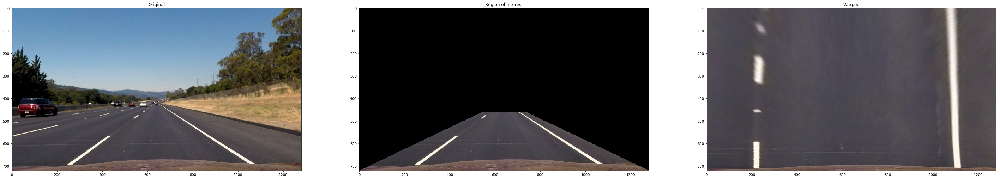

In [11]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    vertices = np.array(vertices, dtype=np.int32)
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, [vertices], ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def warp_matrix(image):
    '''
    warp the image to change perspective.
    the rect area is the same as area of interest before.
    we add an offset to include more area around our region of interest
    '''
    x,y,z=image.shape
    dst = np.float32(config.warp_dst)
    src = np.float32(config.warp_src)
 
    # calculate the perspective transform matrix and warp
    # the perspective to grab the screen
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M,Minv

def warp_image(image):
    img_size = image.shape[1], image.shape[0]
    return cv2.warpPerspective(image, config.warp_M, img_size)

def show_warp(image):
    fig, axes = plt.subplots(1, 3, figsize=(50, 20))
    ax1 = axes.flat[0]
    ax2 = axes.flat[1]
    ax3 = axes.flat[2]
    
    ax1.imshow(image)
    ax1.set_title("Original")
    ax2.imshow(region_of_interest(image, config.warp_src))
    ax2.set_title("Region of interest")
    ax3.imshow(warp_image(image))
    ax3.set_title("Warped")
    plt.show()

coef=545
config.warp_src = [[coef,460],[0,720],[1280,720],[1280-coef,460]]
config.warp_dst = [[0,0],[0,720],[1280,720],[1280,0]]
config.warp_M, config.warp_Minv = warp_matrix(image)
show_warp(image)

I need two parallelograms to define a perspective transform. A source (src) and a destination (dst). To calibrate the perspective transform I select and image with straight lane lines and the car centered on the road. That would make more easily to adjust visualy the parameters.
The src is defined in config.warp_src. I define a paralellogram as wide as the image in the bottom and adjust visualy the top parameters.
For the destination I select a rectangle with the same sizes as the images. The vertical lines of the source paralleogram and the lane lines converge in the horizon. Is dificult to adjust correctly the corners. So I use the parameter coef to help to adjust correctly. I change coef until the resulting image has parallel lane lines.

## Color mask

We use a mix of sobel gradient and color filters to be able to detect lane lines.

With sobel gradient we can filter with gradient changes. We use direction and magnitude of the gradient too.
We filter with HLS colorspace, so we can use luminosity and saturation. It's more easy to work than with RGB.

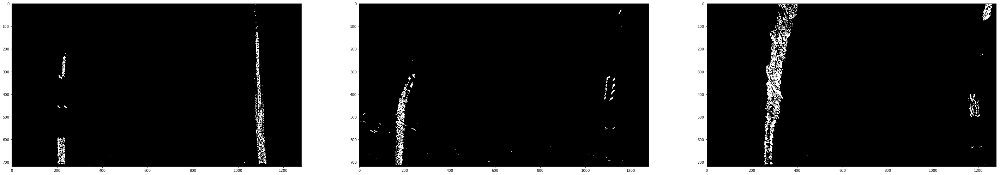

In [13]:
def thresh(img, thresh_min, thresh_max):
    ret = np.zeros_like(img)
    ret[(img >= thresh_min) & (img <= thresh_max)] = 1
    return ret


def combined_binary_mask(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    h=hls[:,:,0]
    l=hls[:,:,1]
    s=hls[:,:,2]
    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=config.mask_ksize)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=config.mask_ksize)
    theta = np.arctan2( np.abs(sobely), np.abs(sobelx))
    abs_sobel = np.sqrt(sobelx**2+sobely**2)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    mag_binary = thresh(scaled_sobel,config.mask_mag_low, config.mask_mag_high)
    dir_binary = thresh(theta, config.mask_dir_low, config.mask_dir_high)
    hls_binary = thresh(s,config.mask_hls_low, config.mask_hls_high)
    bright_binary = thresh(l,config.mask_bright_low, config.mask_bright_high)
    combined = np.zeros_like(mag_binary)
    combined[((mag_binary == 1) & (dir_binary == 1)) |\
         ((hls_binary == 1) & (dir_binary == 1) & (bright_binary == 1))] = 1
    return combined

def interactive_mask(ksize, mag_low, mag_high, dir_low, dir_high, hls_low, hls_high, bright_low, bright_high):
    config.mask_ksize = ksize
    config.mask_mag_high = mag_high
    config.mask_mag_low = mag_low
    config.mask_dir_low = dir_low
    config.mask_dir_high = dir_high
    config.mask_hls_low = hls_low
    config.mask_hls_high = hls_high
    config.mask_bright_low = bright_low
    config.mask_bright_high = bright_high
    fig, axes = plt.subplots(1, 3, figsize=(50, 20))
    ax1 = axes.flat[0]
    ax2 = axes.flat[1]
    ax3 = axes.flat[2]
    
    ax1.imshow(combined_binary_mask(warp_image(image)),cmap='gray')
    ax2.imshow(combined_binary_mask(warp_image(video_images[41])),cmap='gray')
    ax3.imshow(combined_binary_mask(warp_image(video_images[66])),cmap='gray')
    plt.show()
    

config.mask_ksize=3
config.mask_mag_low=36#80
config.mask_mag_high=244
config.mask_dir_low=0.1#0
config.mask_dir_high = 1.2
config.mask_hls_low = 112
config.mask_hls_high= 251
config.mask_bright_low=81#75
config.mask_bright_high=255

interact(interactive_mask, 
         ksize=IntSlider(min=1,max=7,step=2, value=config.mask_ksize), 
         mag_low=IntSlider(min=0,max=255, value=config.mask_mag_low), 
         mag_high=IntSlider(min=0,max=255, value=config.mask_mag_high),
         dir_low=FloatSlider(min=0,max=np.pi/2, step=.1, value=config.mask_dir_low), 
         dir_high=FloatSlider(min=0,max=np.pi/2, step=.1, value=config.mask_dir_high), 
         hls_low=IntSlider(min=0,max=255, value=config.mask_hls_low),
         hls_high=IntSlider(min=0,max=255, value=config.mask_hls_high), 
         bright_low=IntSlider(min=0,max=255, value=config.mask_bright_low), 
         bright_high=IntSlider(min=0,max=255, value=config.mask_bright_high)
);

Visually I adjust the filter parameters (sobel filter kernel size, sobel magnitude, sobel direction, hls channels) to remove noise and have clear lane lines.
For better calibration I included 2 images from the video that are dificult to process because of shadows and change of pavement.

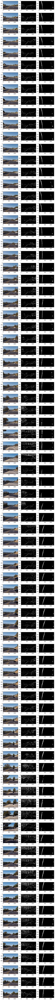

In [14]:
def show_combined_images(images):
    fig, axes = plt.subplots(len(images), 3, figsize=(10, 200))
    combined_images = [combined_binary_mask(image) for image in images]
    combined_warped_images = [combined_binary_mask(warp_image(image)) for image in images]
    #fig.subplots_adjust(hspace=4, wspace=6)
    j=0
    for image, combined, combined_warped in zip(images, combined_images, combined_warped_images):
        ax1 = axes.flat[j]
        ax2 = axes.flat[j+1]
        ax3 = axes.flat[j+2]
        ax1.imshow(image)
        #ax1.set_title("Original")
        ax2.imshow(combined, cmap='gray')
        #ax2.set_title("Combined")
        ax3.imshow(combined_warped, cmap='gray')
        #ax3.set_title("Warped&Combined")
        j +=3
    plt.show()
    
#show test images and undistorted version
show_combined_images(video_images)

I inspect too the video images to watch that the lanes are visible.


## Finding lane lines

Thanks to perspective transform and filters we have and image with only the road lane lines.
As we can see.

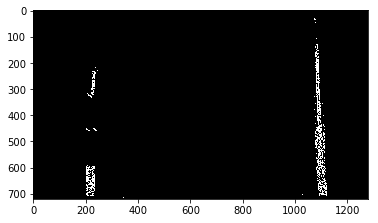

In [15]:
def pipeline_grad_and_color(image):
    return combined_binary_mask(warp_image(image))
img = pipeline_grad_and_color(image)
imshow(img, cmap='gray');


If we create an histogram of the image we can see the distribution of the pixels. In the graph we can determine the position of the lane lines.

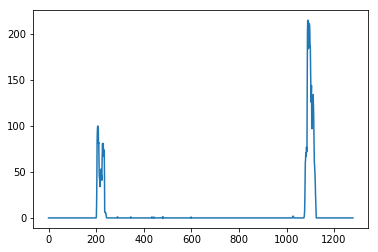

In [16]:
histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
plt.plot(histogram);

To find the lanes position in all the image we create small windows in the y axis. For every small windows we calculate the histogram. For very histogram we calculate and x postion for the left and right side. x postion is calculated by cliping the image where histogram is non zero and the calculating the mean.
After computation we have a set of (x,y) points for the left and right sides. We use numpy polifit to find a second order curve to fit this points. This curve is used later to calculate the lane lines position.
It's important that the 2 lines appear sharp in the histogram an avoid noise in the center. Noise will make the polifit curve wild and unfited for the real lane lines.


In [17]:
def image_to_binary(image, thresh=(0, 255)):
    """
    transform the image to binary output
    """
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    # Return the result
    return binary_output

def find_lines(image):
    binary_warped = image
    #binary_warped = image_to_binary(image)
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    if leftx.size>0:
        left_fit = np.polyfit(lefty, leftx, 2)
    else:
        left_fit=None
    if rightx.size>0:
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        right_fit = None
    return out_img, left_fit, right_fit, nonzerox, nonzeroy,left_lane_inds,right_lane_inds

## Calculating radius and other parameters

- Here the idea is to take the measurements of where the lane lines are and estimate how much the road is curving and where the vehicle is located with respect to the center of the lane. The radius of curvature may be given in meters assuming the curve of the road follows a circle. For the position of the vehicle, you may assume the camera is mounted at the center of the car and the deviation of the midpoint of the lane from the center of the image is the offset you're looking for. As with the polynomial fitting, convert from pixels to meters.
- nothing was tell about radius of curvature, but original template contains separate section for it - 

## Resulting images

In [18]:
def visualize_lines(images):
    """
    plot the lines in the image
    """
    fig, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(10, 200))
    fig.tight_layout()
    for i,image in enumerate(images):
        ax1 = axes.flat[2*i]
        ax2 = axes.flat[2*i+1]
        ax1.imshow(image)
        #ax1.set_title('Original Image', fontsize=50)
        img = pipeline_grad_and_color(image)
        out_img, left_fit, right_fit, nonzerox,nonzeroy,left_lane_inds,right_lane_inds = find_lines(img)
        ploty = np.linspace(0, image.shape[0]-1, image.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [255, 0, 0]
    
        # Plot the result
        ax2.imshow(out_img)
        #ax2.set_title('Box lines', fontsize=50)
        ax2.plot(left_fitx, ploty, color='yellow')
        ax2.plot(right_fitx, ploty, color='yellow')
        ax2.set_xlim(0, 1280)
        ax2.set_ylim(720, 0)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#plot the images and the computed lines
#when we inspect visualy the results we can see that is very easy to lose the yellow lines when the
#background is almost white. The second image serves as an example.
visualize_lines(video_images)

In the previous plot we can see that the lanes lines computed fits the image. It's important to have enough points for every side. Not enough points would make the lines erratic.

## Pipeline procesing

In this part we define the pipeline function. 
In the pipeline function I included the curvature and postion. I inform of both values in the video.

The position has been calculated knowing before hand the distance by pixels and taking in account the perspective transform.

The curvature radius is calculated as the mean of the left and right curvatures. Knowing the points x,y of a quadratic function allow us to calculate the radius r that better fits that curve. 

In [46]:
#if we don't find the lines we use the previous line founded
previous_left_fit = None
previous_right_fit = None
pipeline_history=9

def pipeline_lanes(undist):
    """
    process the image through the pipeline. 
    This pipeline includes the steps:
    - undistord image
    - warp image
    - color and gradient filter
    - find lines and plot them.
    - compute curvature and car position
    """
    global previous_left_fit, previous_right_fit
    image = undistord_image(undist)
    image_size = image.shape[0],image.shape[1]
    
    warped, M, Minv = warp_image( image ), config.warp_M, config.warp_Minv
    warped = image_to_binary(warped)
    img = pipeline_grad_and_color(undist)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    out_img, left_fit, right_fit, nonzerox,nonzeroy,left_lane_inds,right_lane_inds = find_lines(img)
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    if previous_left_fit is None: previous_left_fit = []
    if previous_right_fit is None: previous_right_fit = []
    previous_right_fit = previous_right_fit[:pipeline_history]
    if left_fit is not None:
        previous_left_fit = [left_fit] + previous_left_fit[:pipeline_history]
    left_fit = np.mean(np.array(previous_left_fit), axis=0)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    if right_fit is not None:
        previous_right_fit = [right_fit] + previous_right_fit[:pipeline_history]
    right_fit = np.mean(np.array(previous_right_fit),axis=0)    
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])

    
    # Recast the x and y points into usable format for cv2.fillPoly()
    if pts_left is not None and pts_right is not None:
        pts = np.hstack((pts_left, pts_right))
    elif pts_left is not None:
        pts = np.hstack((pts_left,))
    elif pts_right is not None:
        pts = np.hstack((pts_right,))
    else:
        pts = None

    # Draw the lane onto the warped blank image
    if pts is not None:
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)  
    
    try:
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        y_eval = np.max(ploty)
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
        left_c = left_fit[0] * image_size[0] ** 2 + left_fit[1] * image_size[0] + left_fit[2]
        right_c = right_fit[0] * image_size[0] ** 2 + right_fit[1] * image_size[0] + right_fit[2]
        width = right_c - left_c
        xm_per_pix = 3.7 / width
        ym_per_pix = (30/700)*(width/700)
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

        curvature = (left_curverad + right_curverad) / 2
        cv2.putText(result, "Curvature: {0:.2f}m".format(curvature), (30,60), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), thickness=10)
    
        bottom_leftx = left_fitx[-1]
        bottom_rightx = right_fitx[-1]
    
        lane_center = (bottom_leftx + bottom_rightx) / 2
    
        car_center = 1280 / 2
    
        difference = lane_center - car_center
    
        difference_meters = difference * xm_per_pix
    
        cv2.putText(result, "{0:.2f}m left of center".format(difference_meters), (30,110), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), thickness=10)
        
    except:
        #if we cannot compute the lines because we loose the lines show normal image
        pass
    return result

### Visual inspection before procesing

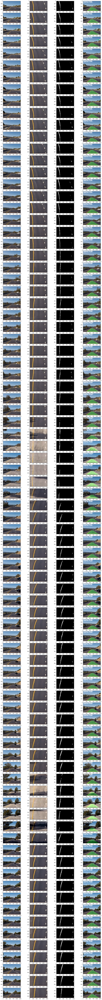

In [41]:
def show_lanes(images):
    fig, axes = plt.subplots(nrows=len(images), ncols=4, figsize=(20, 200))
    for i,image in enumerate(images):
        axes.flat[4*i].imshow(image)
        axes.flat[4*i+1].imshow(warp_image(image))
        axes.flat[4*i+2].imshow( pipeline_grad_and_color(image), cmap='gray')
        axes.flat[4*i+3].imshow(pipeline_lanes(image))
#show the test images through the pipeline so we can inspect visually the results.
show_lanes(video_images)

I inspect visualy that the lane area is calculated properly for all the images.

## Project video

With the pipeline created we can process the project video to see the results.

### Video clips

To better adjust the parameters I create 2 video clips of the 2 most complicated parts to be able to inspect fast.

In [42]:
# Process pipeline with aditional information
def process_image_ex(img):
    undist = undistord_image(img)
    #img_binary, img_stack = # funcation that returns binary image (img_binary) and image with combination of all thresholds images (img_stack) - it will be displayed near process frame later
    warped, Minv = warp_image(img), config.warp_M
    #lanes, ploty, left_fitx, right_fitx, left_curverad, right_curverad, center_dist = # function that detects lines and lane
    output = pipeline_lanes(img)

    output1 = cv2.resize(cv2.bitwise_and(img, img, mask= combined_binary_mask(img) ),(640, 360), interpolation = cv2.INTER_AREA)
    output2 = cv2.resize(cv2.bitwise_and(img, img, mask= pipeline_grad_and_color(img)),(640, 360), interpolation = cv2.INTER_AREA)
    
    
    # Create an array big enough to hold both images next to each other.
    vis = np.zeros((720, 1280+640, 3))

    # Copy both images into the composed image.
    vis[:720, :1280,:] = output
    vis[:360, 1280:1920,:] = output1
    vis[360:720, 1280:1920,:] = output2

    return vis

In [43]:
def pipelined_video(pipeline, video_output, video_input='project_video.mp4', process=False, subclip=None):
    '''
    helper video that process input video through pipeline and writes to video_output
    '''
    if process:
        clip1 = VideoFileClip(video_input)
        if subclip is None:
            white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
            %time white_clip.write_videofile(video_output, audio=False) 
        else:
            for start_time, end_time in subclip:
                sclip1 = clip1.subclip(start_time, end_time) 
                white_clip = sclip1.fl_image(pipeline) #NOTE: this function expects color images!!
                %time white_clip.write_videofile(video_output, audio=False) 
    return HTML("""
    <video width="960" height="540" controls>
      <source src="{0}">
    </video>
    """.format(video_output))

In [50]:
previous_left_fit = previous_right_fit = None

#show the project video through the final pipeline
pipelined_video(process_image_ex, 'lanes_project_video_20_25.mp4', subclip=[(20,25)], process=False)

We have to take in account the change of pavement for a more clear one.

In [51]:
previous_left_fit = previous_right_fit = None

#show the project video through the final pipeline
pipelined_video(process_image_ex, 'lanes_project_video_38_43.mp4', subclip=[(38,43)], process=False)

We have to take in account the shadows too.

### Final project video

When everything is checked and the pipeline works properly we process the whole project video.

In [52]:
previous_left_fit = previous_right_fit = None

#show the project video through the final pipeline
pipelined_video(pipeline_lanes, 'lanes_project_video.mp4', process=False)

## Conclusions

The most dificult part is to find the best parameters for the pipeline. The road conditions change and the paramenters have to work in a large variety of conditions.
The first step to a robust pipeline is to adjust threshold and filters. Is important to inspect problematic images to correct calibrations as soon as posible. Later, using small video clips with extra information helps to detect what king of problem has the pipeline.
Even with a good parameter adjustment, checked by visualy inspect the video images, in one ocasion the right side of the road was lost. To avoid this problem I added a lane calculations history and made the mean. I use a history of 10 frames. The video is 60fps and the road smooth so is good enough. In this way we avoid the problem that the lanes cannot be computed for a frame. We use the mean between previous lane calculations to avoid abrupt changes between frames.
This pipeline is optimized for a very specific road condition, weather, daylight, lane colors, etc. The best way to take in account all this is to adapt the parameters to diferent coditions. As our change the pupile size with lighting conditions diferent paramenters work better in diferent conditions.